In [1]:
%reload_ext autoreload
%autoreload 2

In [2]:
import spyglass as nd
    
# ignore datajoint+jupyter async warnings
import warnings
warnings.simplefilter('ignore', category=DeprecationWarning)
warnings.simplefilter('ignore', category=ResourceWarning)

Connecting edeno@lmf-db.cin.ucsf.edu:3306


In [3]:
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
import logging

FORMAT = '%(asctime)s %(message)s'

logging.basicConfig(level='INFO', format=FORMAT, datefmt='%d-%b-%y %H:%M:%S')

In [4]:
nwb_copy_file_name = 'chimi20200216_new_.nwb'

## Marks

The first thing we need are the marks for the clusterless decoding. This depends on the SpikeSorting and CuratedSpikeSorting tables, but we can circumvent using a spike sorter by using the `clusterless_thresholder` as our given spikesorter, which simply thresholds the spikeband waveforms and returns a single multiunit cluster. Here we use mark parameters `default`.



In [5]:
import pandas as pd
from spyglass.decoding.clusterless import UnitMarks


pd.DataFrame(
    (UnitMarks() & {'nwb_file_name': nwb_copy_file_name,
                    'unit_inclusion_param_name': 'all2'}))

/home/edeno/miniconda3/envs/spyglass/lib/python3.8/site-packages/spikeinterface/extractors/neoextractors/spikeglx.py:9: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  HAS_NEO_11 = distutils.version.LooseVersion(neo.__version__) >= '0.11'
/home/edeno/miniconda3/envs/spyglass/lib/python3.8/site-packages/setuptools/_distutils/version.py:351: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
/home/edeno/miniconda3/envs/spyglass/lib/python3.8/site-packages/ripple_detection/core.py:10: DeprecationWarning: Please use `gaussian_filter1d` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import gaussian_filter1d


,curation_id,nwb_file_name,sort_group_id,sort_interval_name,preproc_params_name,team_name,sorter,sorter_params_name,artifact_removed_interval_list_name,mark_param_name,analysis_file_name,marks_object_id
0,0,chimi20200216_new_.nwb,22,runs_noPrePostTrialTimes raw data valid times,franklab_tetrode_hippocampus,ac_em_xs,clusterless_thresholder,default_clusterless,chimi20200216_new_.nwb_runs_noPrePostTrialTime...,default,chimi20200216_new_1T7ED8HQJA.nwb,3b08d08e-9d4f-483a-943b-6cb85d77d179
1,0,chimi20200216_new_.nwb,14,runs_noPrePostTrialTimes raw data valid times,franklab_tetrode_hippocampus,ac_em_xs,clusterless_thresholder,default_clusterless,chimi20200216_new_.nwb_runs_noPrePostTrialTime...,default,chimi20200216_new_2GVTK46I9M.nwb,6f1754b5-5fdc-468c-8c23-dd3b697d6ac5
2,0,chimi20200216_new_.nwb,13,runs_noPrePostTrialTimes raw data valid times,franklab_tetrode_hippocampus,ac_em_xs,clusterless_thresholder,default_clusterless,chimi20200216_new_.nwb_runs_noPrePostTrialTime...,default,chimi20200216_new_2ZXP1LOTOP.nwb,a1cc2e99-d504-4a86-9c52-5d2ca2046407
3,0,chimi20200216_new_.nwb,0,runs_noPrePostTrialTimes raw data valid times,franklab_tetrode_hippocampus,ac_em_xs,clusterless_thresholder,default_clusterless,chimi20200216_new_.nwb_runs_noPrePostTrialTime...,default,chimi20200216_new_3CO1EF20RI.nwb,98b132fa-9527-4959-95cd-d866de13f2de
4,0,chimi20200216_new_.nwb,11,runs_noPrePostTrialTimes raw data valid times,franklab_tetrode_hippocampus,ac_em_xs,clusterless_thresholder,default_clusterless,chimi20200216_new_.nwb_runs_noPrePostTrialTime...,default,chimi20200216_new_APM0I1FGWT.nwb,949ecbb3-c0f1-409b-906c-99d5a9782b88
5,0,chimi20200216_new_.nwb,12,runs_noPrePostTrialTimes raw data valid times,franklab_tetrode_hippocampus,ac_em_xs,clusterless_thresholder,default_clusterless,chimi20200216_new_.nwb_runs_noPrePostTrialTime...,default,chimi20200216_new_BFGSUHP430.nwb,7cfa8ce3-54b2-4921-9daf-6d25af3634f8
6,0,chimi20200216_new_.nwb,15,runs_noPrePostTrialTimes raw data valid times,franklab_tetrode_hippocampus,ac_em_xs,clusterless_thresholder,default_clusterless,chimi20200216_new_.nwb_runs_noPrePostTrialTime...,default,chimi20200216_new_BYUS6ARJ37.nwb,77316dd8-d1b0-42a3-be2f-dbbf914dd582
7,0,chimi20200216_new_.nwb,21,runs_noPrePostTrialTimes raw data valid times,franklab_tetrode_hippocampus,ac_em_xs,clusterless_thresholder,default_clusterless,chimi20200216_new_.nwb_runs_noPrePostTrialTime...,default,chimi20200216_new_DHF6YOSH3P.nwb,c9be4540-52db-4e17-b1ed-76fd1af02da6
8,0,chimi20200216_new_.nwb,6,runs_noPrePostTrialTimes raw data valid times,franklab_tetrode_hippocampus,ac_em_xs,clusterless_thresholder,default_clusterless,chimi20200216_new_.nwb_runs_noPrePostTrialTime...,default,chimi20200216_new_FDBD4FYDC7.nwb,5875c6f8-3abb-424b-a2cc-d76fda94bbed
9,0,chimi20200216_new_.nwb,9,runs_noPrePostTrialTimes raw data valid times,franklab_tetrode_hippocampus,ac_em_xs,clusterless_thresholder,default_clusterless,chimi20200216_new_.nwb_runs_noPrePostTrialTime...,default,chimi20200216_new_FQNK5UMVQ7.nwb,cc6db229-1543-42c7-8db8-fc22d5693d7f


After populating the UnitMarks table, we now need to turn those marks into a marks indicator via the UnitMarksIndicator table. This bins time at a specified sampling frequency (default 2 ms bins or 500 Hz), returning a NaN if there is no spike in that time bin and returning marks if there is a spike in that time bin. If more than one spike is in a single time bin from a single tetrode, we just average the marks. Technically this isn't ideal, we should use all the marks, but it doesn't seem to happen that often and the decodes seem robust to it.

The UnitMarksIndicator table depends on an interval from the interval list and a sampling rate.

In [6]:
from spyglass.decoding.clusterless import UnitMarksIndicatorSelection, UnitMarksIndicator, UnitMarks


selection = ((UnitMarks() &
  {'nwb_file_name': nwb_copy_file_name,
   'unit_inclusion_param_name': 'all2'})
 * 
  (nd.common.IntervalList() &
   {'nwb_file_name': nwb_copy_file_name, 'interval_list_name': 'pos 1 valid times'})
  )

UnitMarksIndicatorSelection.insert(selection, ignore_extra_fields=True, skip_duplicates=True)

UnitMarksIndicator.populate()

29-Mar-22 16:10:43 Found 0 keys to populate


After we've populated this table, we can fetch all the mark indicators from a set of electrodes using the `fetch_xarray` method. `xarray` is just a python package that produces labeled multidimensional arrays. The decoding results will also come in this format.

In [7]:
marks = (UnitMarksIndicator & {
    'nwb_file_name': nwb_copy_file_name,
    'sort_interval_name': 'runs_noPrePostTrialTimes raw data valid times',
    'filter_parameter_set_name': 'franklab_default_hippocampus',
    'unit_inclusion_param_name': 'all2',
    'mark_param_name': 'default',
    'interval_list_name': 'pos 1 valid times',
    'sampling_rate': 500,    
}).fetch_xarray()

marks

/home/edeno/miniconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/chimi20200216_new_7M0E8ERPE7.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/edeno/miniconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/chimi20200216_new_6WW86B509M.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/edeno/miniconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/chimi20200216_new_TLD0MCIC5H.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/edeno/miniconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/c

<xarray.DataArray (time: 655645, marks: 4, electrodes: 22)>
array([[[  nan,   nan,   nan, ...,   nan,   nan,   nan],
        [  nan,   nan,   nan, ...,   nan,   nan,   nan],
        [  nan,   nan,   nan, ...,   nan,   nan,   nan],
        [  nan,   nan,   nan, ...,   nan,   nan,   nan]],

       [[  nan,   nan,   nan, ...,   nan,   nan,   nan],
        [  nan,   nan,   nan, ...,   nan,   nan,   nan],
        [  nan,   nan,   nan, ...,   nan,   nan,   nan],
        [  nan,   nan,   nan, ...,   nan,   nan,   nan]],

       [[  nan,   nan,   nan, ...,   nan,   nan,   nan],
        [  nan,   nan,   nan, ...,   nan,   nan,   nan],
        [  nan,   nan,   nan, ...,   nan,   nan,   nan],
        [  nan,   nan,   nan, ...,   nan,   nan,   nan]],

       ...,

       [[  nan,   nan,   47., ...,   nan,   nan,   nan],
        [  nan,   nan,   33., ...,   nan,   nan,   nan],
        [  nan,   nan, -144., ...,   nan,   nan,   nan],
        [  nan,   nan,    2., ...,   nan,   nan,   nan]],

       [[  nan,   nan,   nan, ...,   nan,   nan,   nan],
        [  nan,   nan,   nan, ...,   nan,   nan,   nan],
        [  nan,   nan,   nan, ...,   nan,   nan,   nan],
        [  nan,   nan,   nan, ...,   nan,   nan,   nan]],

       [[  nan,   nan,   nan, ...,   nan,   nan,   nan],
        [  nan,   nan,   nan, ...,   nan,   nan,   nan],
        [  nan,   nan,   nan, ...,   nan,   nan,   nan],
        [  nan,   nan,   nan, ...,   nan,   nan,   nan]]])
Coordinates:
  * time     (time) float64 1.582e+09 1.582e+09 ... 1.582e+09 1.582e+09
  * marks    (marks) <U11 'amplitude_0' 'amplitude_1' ... 'amplitude_3'
Dimensions without coordinates: electrodes

After you get the marks, it is important to visualize them to make sure they look right. We can use the `plot_all_marks` method of UnitMarksIndicator to quickly plot each mark feature against the other for each electrode.

Here it is important to look for things that look overly correlated (strong diagonal on the off-diagonal plots) and for extreme amplitudes.

/stelmo/edeno/spyglass/src/spyglass/decoding/clusterless.py:260: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(n_features, n_features,


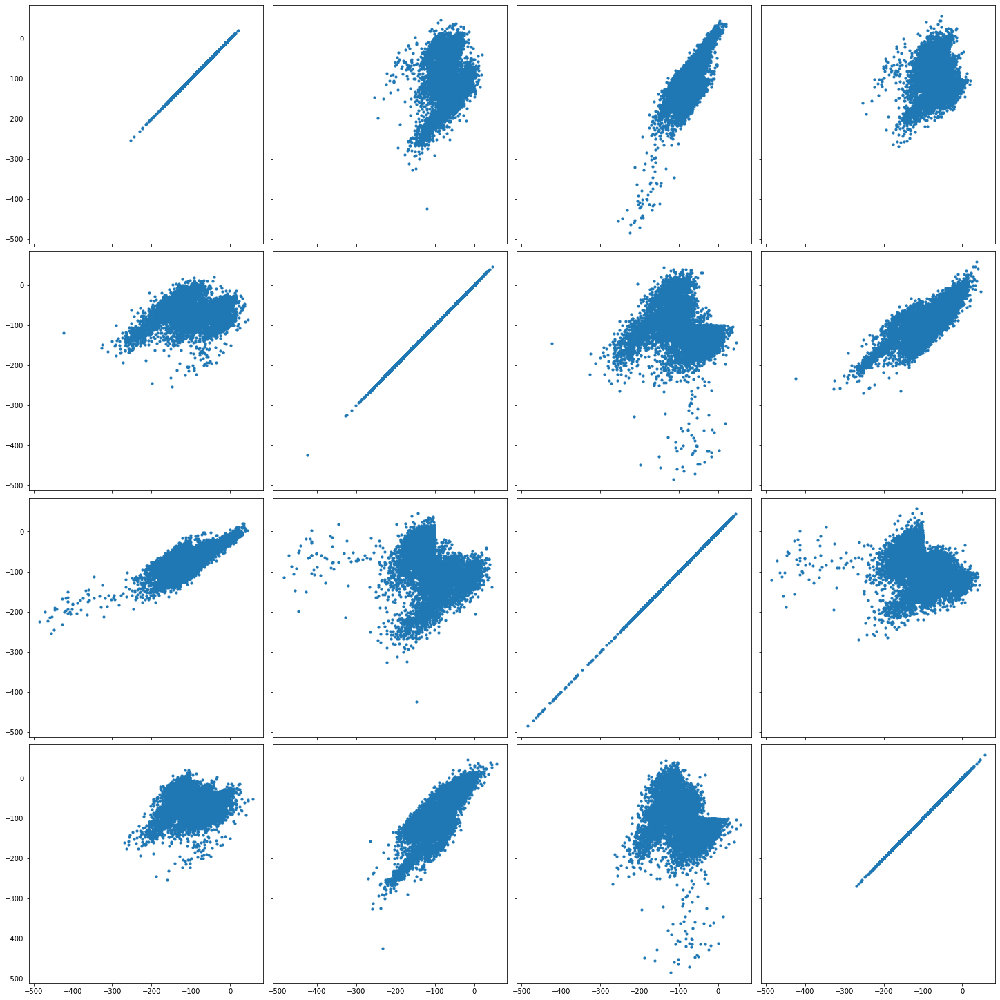

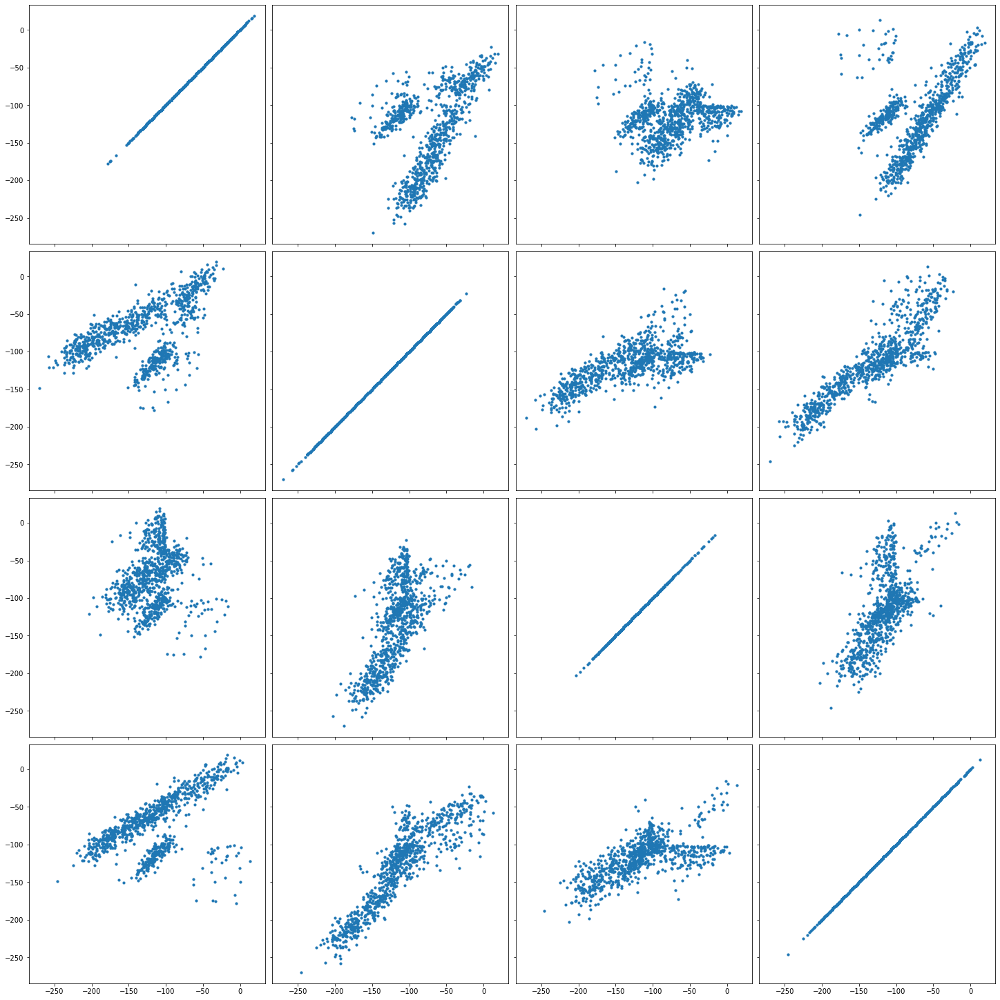

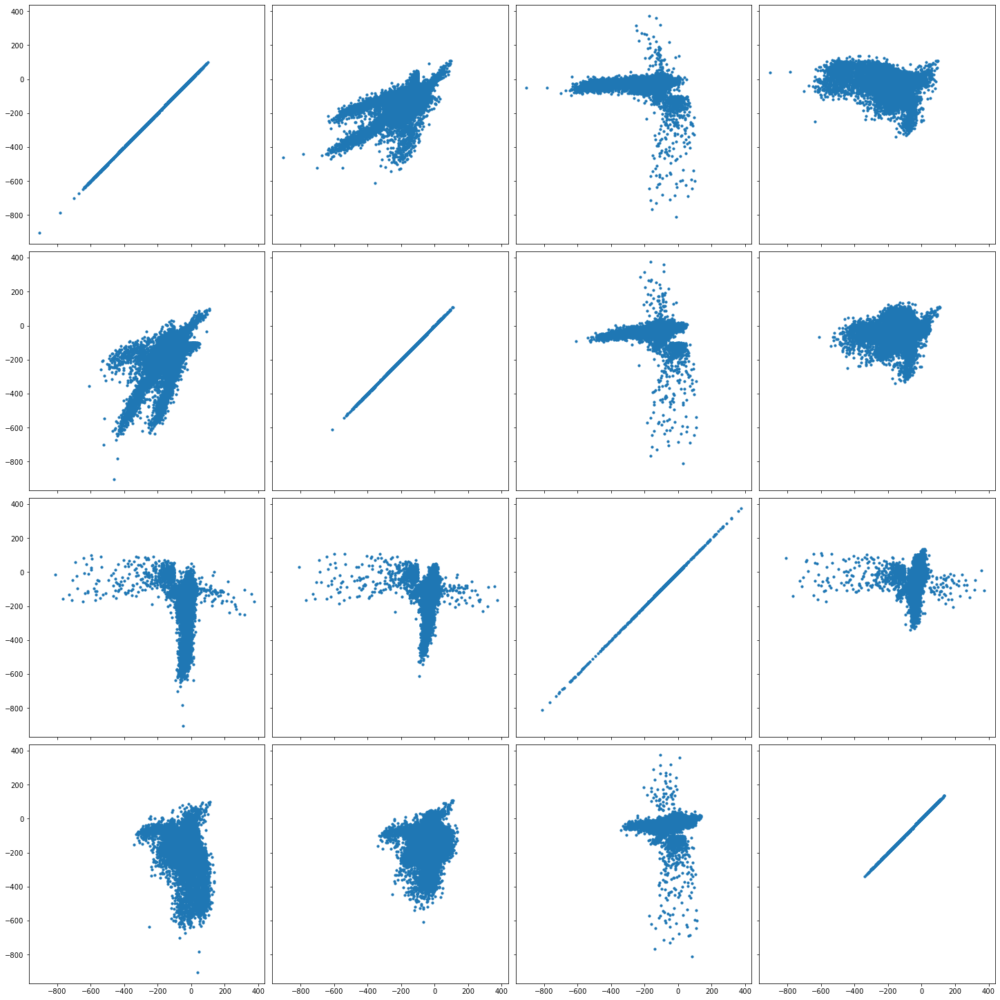

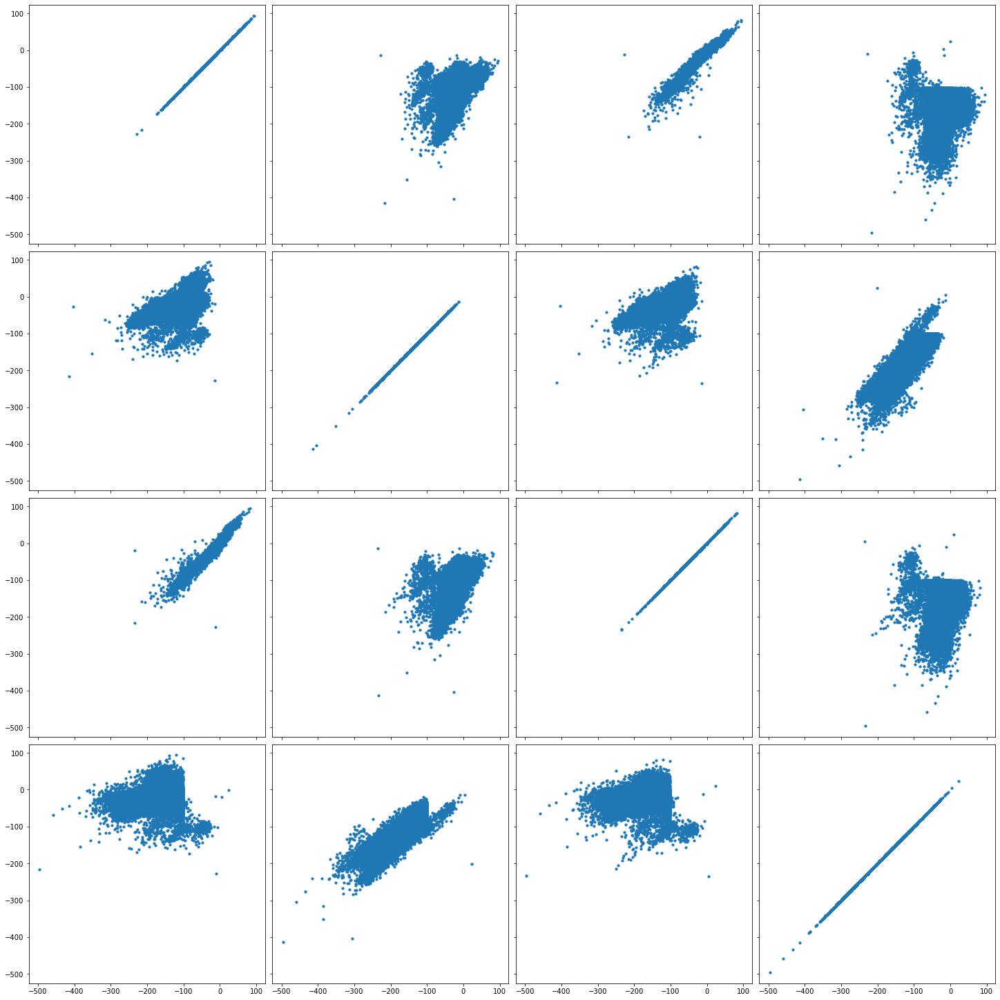

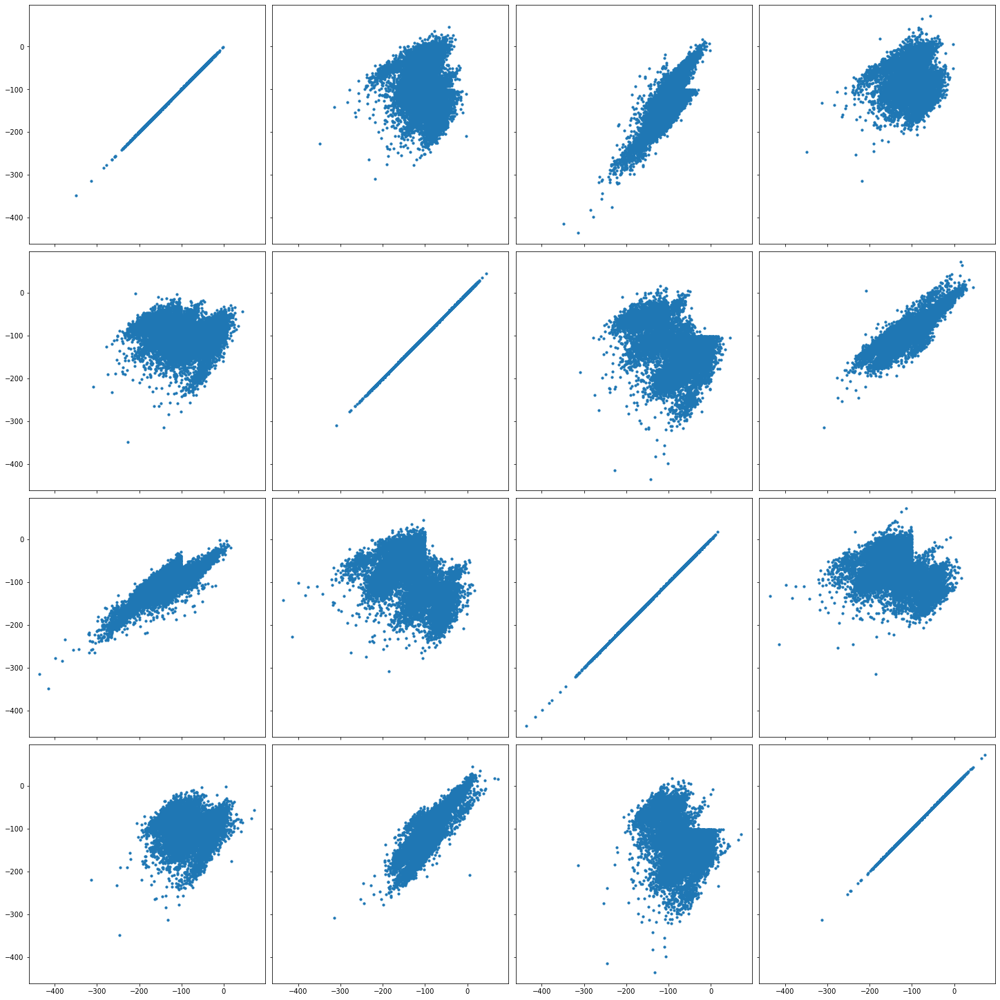

...

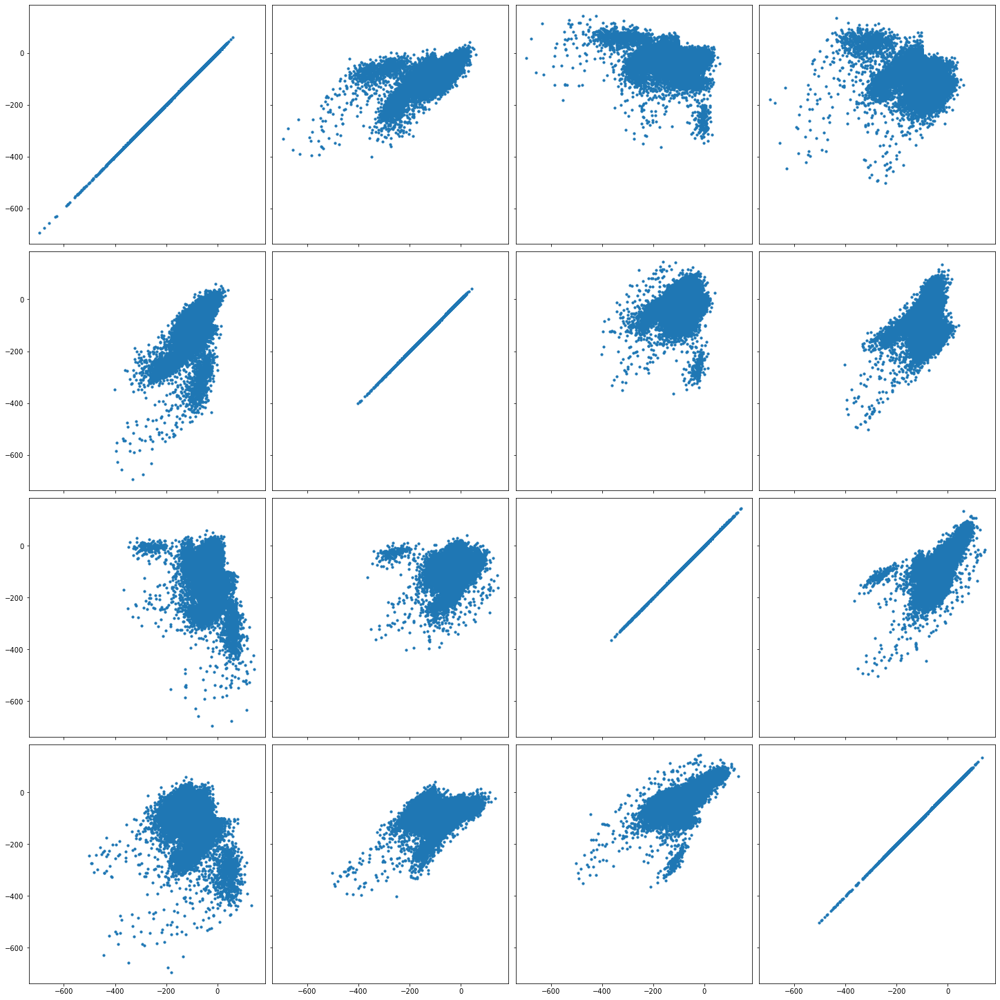

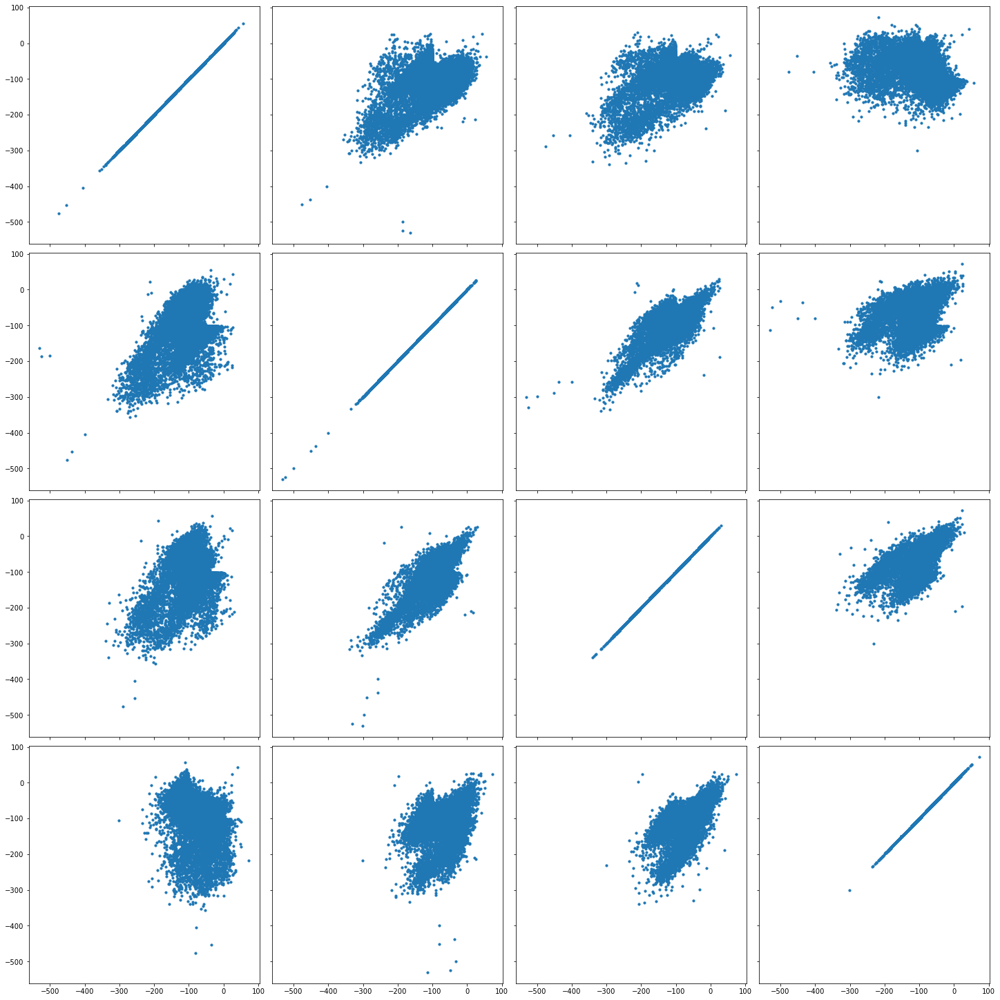

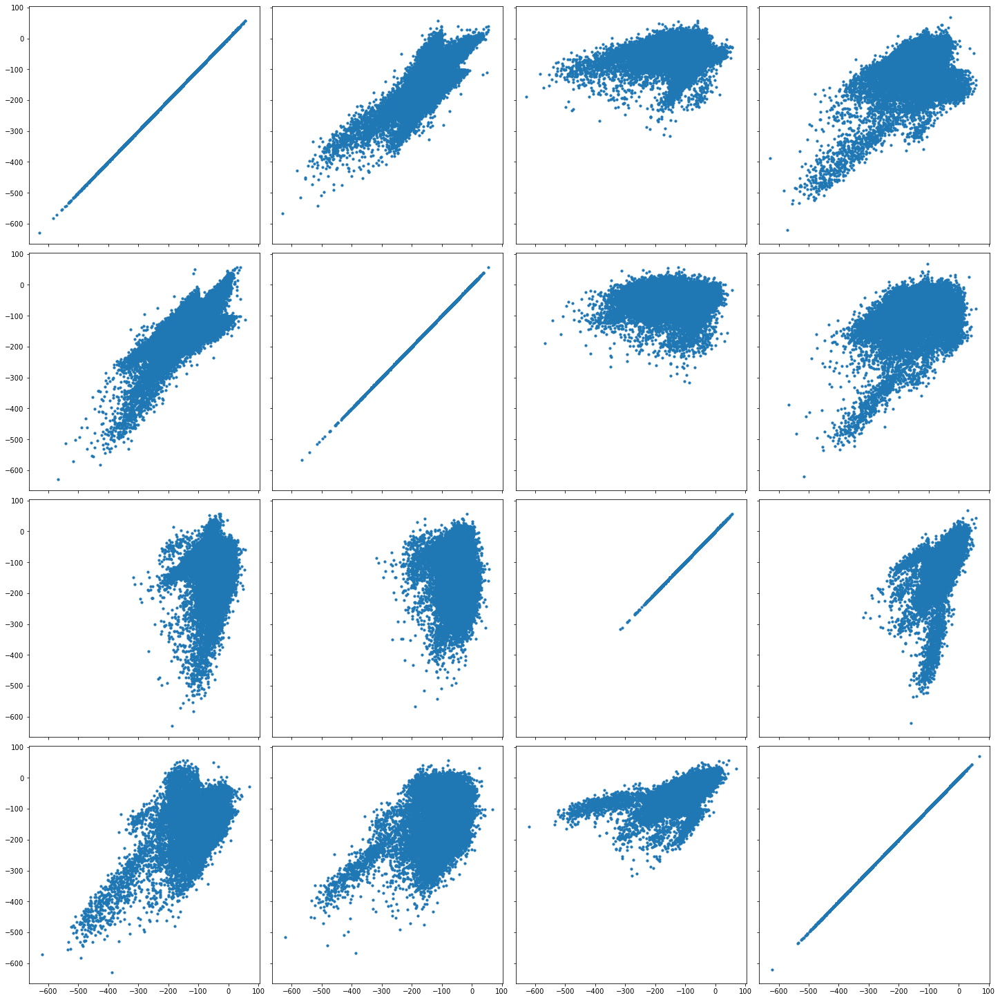

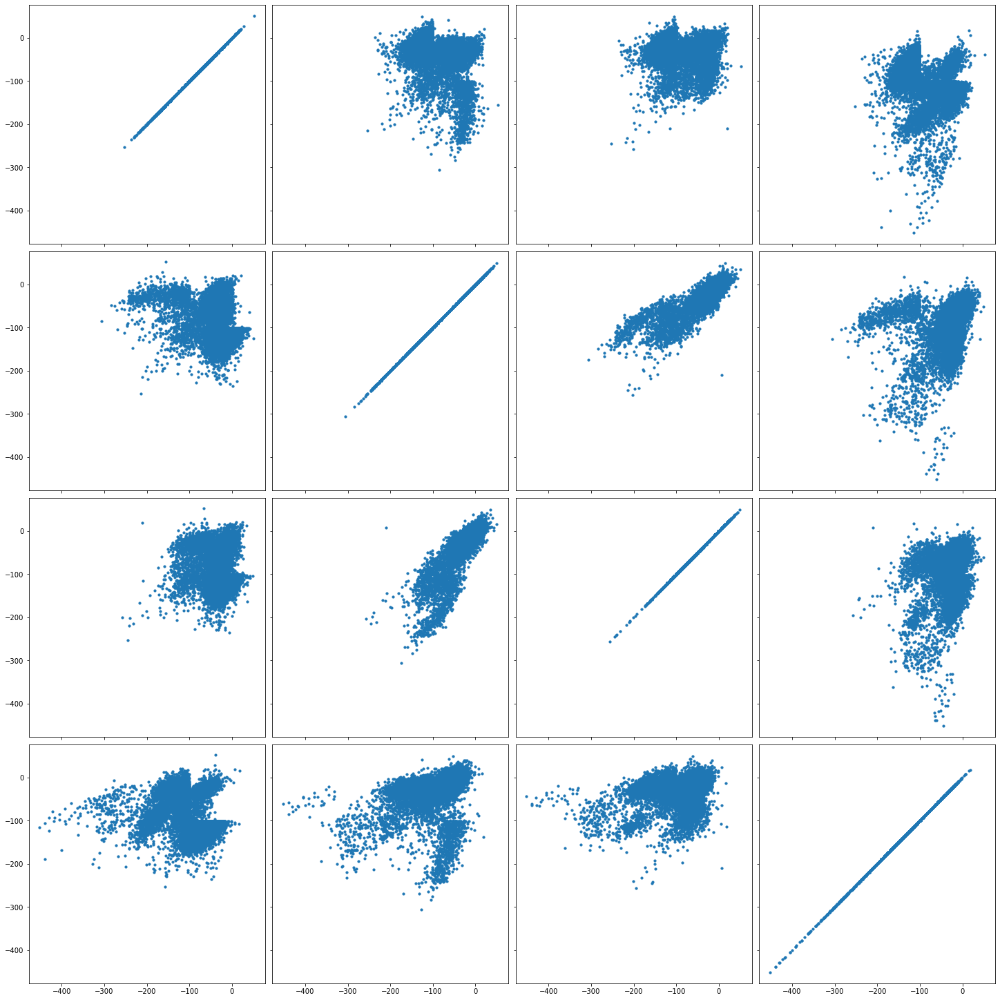

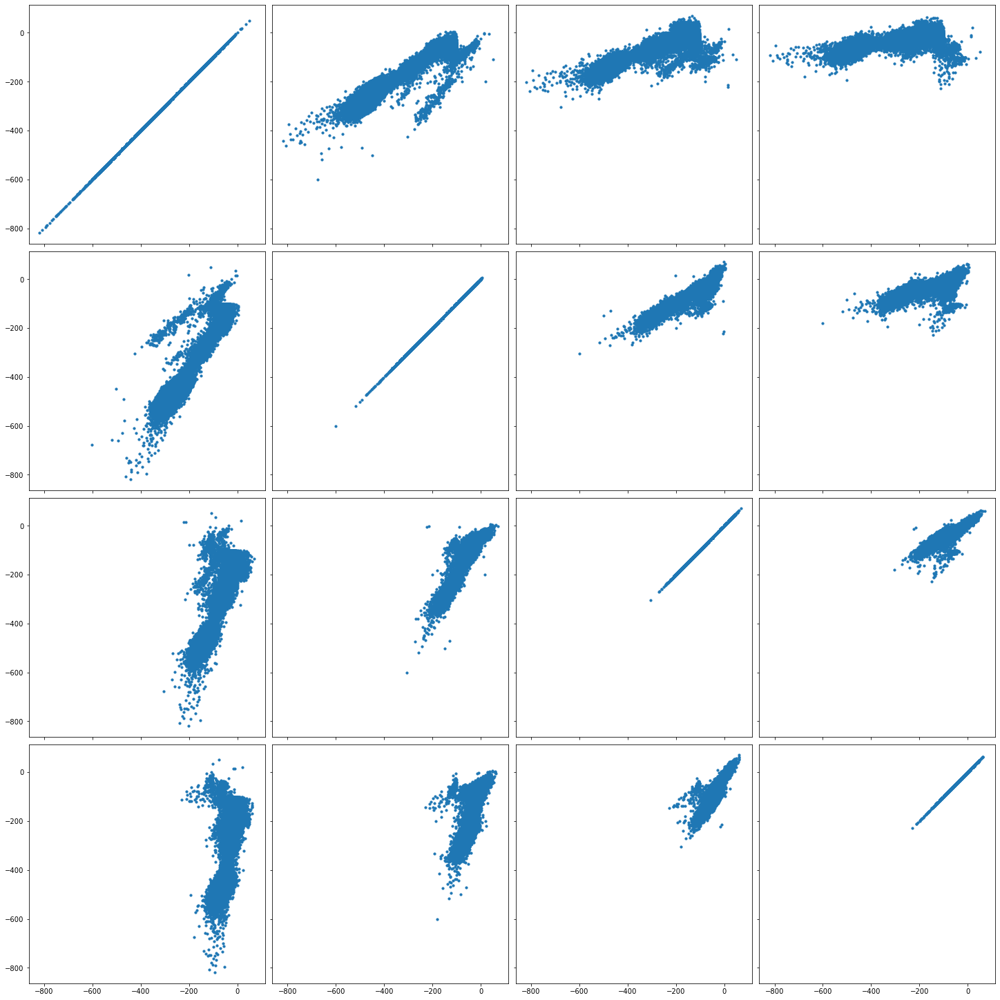

In [8]:
UnitMarksIndicator.plot_all_marks(marks)

## Position

After the marks look good, you'll need to load/populate the 2D position data. This comes from the `IntervalPositionInfo` table. See the position tutorial for more information. Note that we will need to upsample the position data (which is done here via the `default_decoding` parameters) to match the sampling frequency that we intend to decode in (2 ms time bins or 500 Hz sampling rate)

In [9]:
from spyglass.common.common_position import IntervalPositionInfo, IntervalPositionInfoSelection

IntervalPositionInfoSelection.insert1(
    {'nwb_file_name': nwb_copy_file_name,
     'interval_list_name': 'pos 1 valid times',
     'position_info_param_name': 'default_decoding'
    }, skip_duplicates=True)

IntervalPositionInfo.populate()


position_info = (IntervalPositionInfo() &
                 {'nwb_file_name': nwb_copy_file_name,
                  'interval_list_name': 'pos 1 valid times',
                  'position_info_param_name': 'default_decoding'}
                ).fetch1_dataframe()

position_info

29-Mar-22 16:11:43 Found 0 keys to populate
/home/edeno/miniconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/chimi20200216_new_6YC9LPAR7S.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/edeno/miniconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/edeno/miniconda3/envs/spyglass/lib/python3.8/site-packages/hdmf/spec/namespace.py:532: UserWarning: Ignoring cached namespace 'core' version 2.3.0 because version 2.4.0 is already loaded.
  warn("Ignoring cached namespace '%s' version %s because version %s is already loaded."
/home/edeno/miniconda3/envs/spyglass/lib/python3.8/site-packages/hdmf/spec/namespace.py:532: UserWarning: Ignoring cached namespace 'ndx-franklab-novela' versio

,head_position_x,head_position_y,head_orientation,head_velocity_x,head_velocity_y,head_speed
time,,,,,,
1.581887e+09,91.051650,211.127050,2.680048,1.741550,2.301478,2.886139
1.581887e+09,91.039455,211.144123,3.003241,1.827555,2.333931,2.964320
1.581887e+09,91.027260,211.161196,3.008398,1.915800,2.366668,3.044898
1.581887e+09,91.015065,211.178268,3.012802,2.006286,2.399705,3.127901
1.581887e+09,91.002871,211.195341,3.017242,2.099012,2.433059,3.213352
...,...,...,...,...,...,...
1.581888e+09,182.158583,201.299625,-0.944304,0.057520,-0.356012,0.360629
1.581888e+09,182.158583,201.296373,-0.942329,0.053954,-0.356343,0.360404
1.581888e+09,182.158583,201.293121,-0.940357,0.050477,-0.356407,0.359964


It is important to visualize the 2D position to make sure there are no weird values.

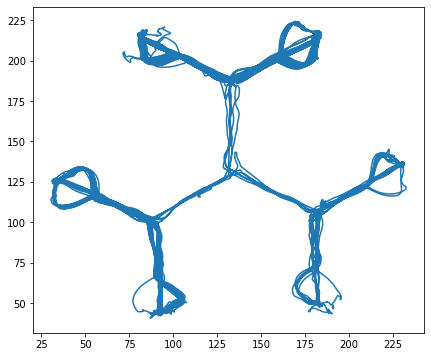

In [10]:
plt.figure(figsize=(7, 6))
plt.plot(position_info.head_position_x, position_info.head_position_y)

Next we populate/load the linearized position tables. Again refer to the linear position tutorials for more information.

In [11]:
from spyglass.common.common_position import LinearizationParameters

LinearizationParameters.insert1({'linearization_param_name': 'default'}, skip_duplicates=True)
LinearizationParameters()

linearization_param_name name for this set of parameters,use_hmm use HMM to determine linearization,route_euclidean_distance_scaling How much to prefer route distances between successive time points that are closer to the euclidean distance. Smaller numbers mean the route distance is more likely to be close to the euclidean distance.,sensor_std_dev Uncertainty of position sensor (in cm).,diagonal_bias Biases the transition matrix to prefer the current track segment.
deafult,0,1.0,5.0,0.5
default,0,1.0,5.0,0.5


In [12]:
from spyglass.common.common_position import IntervalLinearizationSelection, IntervalLinearizedPosition


IntervalLinearizationSelection.insert1(
    {'position_info_param_name': 'default',
     'nwb_file_name': nwb_copy_file_name,
     'interval_list_name': 'pos 1 valid times',
     'track_graph_name': '6 arm',
     'linearization_param_name': 'default'
    }, skip_duplicates=True)

IntervalLinearizationSelection.insert1(
    {'position_info_param_name': 'default_decoding',
     'nwb_file_name': nwb_copy_file_name,
     'interval_list_name': 'pos 1 valid times',
     'track_graph_name': '6 arm',
     'linearization_param_name': 'default'
    }, skip_duplicates=True)

IntervalLinearizationSelection() & {'nwb_file_name': nwb_copy_file_name}

position_info_param_name name for this set of parameters,nwb_file_name name of the NWB file,interval_list_name descriptive name of this interval list,track_graph_name,linearization_param_name name for this set of parameters
default,chimi20200216_new_.nwb,pos 1 valid times,6 arm,deafult
default,chimi20200216_new_.nwb,pos 1 valid times,6 arm,default
default_decoding,chimi20200216_new_.nwb,pos 1 valid times,6 arm,deafult
default_decoding,chimi20200216_new_.nwb,pos 1 valid times,6 arm,default


In [13]:
IntervalLinearizedPosition.populate()

29-Mar-22 16:11:46 Found 0 keys to populate


In [14]:
from spyglass.common.common_position import IntervalLinearizedPosition

linear_position_df = (IntervalLinearizedPosition() &
 {'nwb_file_name': nwb_copy_file_name,
  'interval_list_name': 'pos 1 valid times',
  'position_info_param_name': 'default_decoding'}
).fetch1_dataframe()

linear_position_df

/home/edeno/miniconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/chimi20200216_new_EK07IH7C4Z.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/edeno/miniconda3/envs/spyglass/lib/python3.8/site-packages/datajoint/hash.py:39: ResourceWarning: unclosed file <_io.BufferedReader name='/stelmo/nwb/analysis/chimi20200216_new_UHVG0MXUHW.nwb'>
  return uuid_from_stream(Path(filepath).open("rb"), init_string=init_string)
/home/edeno/miniconda3/envs/spyglass/lib/python3.8/site-packages/h5py/_hl/dataset.py:541: DeprecationWarning: Passing None into shape arguments as an alias for () is deprecated.
  arr = numpy.ndarray(selection.mshape, dtype=new_dtype)
/home/edeno/miniconda3/envs/spyglass/lib/python3.8/site-packages/hdmf/spec/namespace.py:532: UserWarning: Ignoring cached namespace 'core' version 2.3.0 because version 2.4.0 is already loaded.
  warn("Ignorin

,linear_position,track_segment_id,projected_x_position,projected_y_position
time,,,,
1.581887e+09,412.042773,0,90.802281,210.677533
1.581887e+09,412.061718,0,90.785714,210.686724
1.581887e+09,412.080664,0,90.769147,210.695914
1.581887e+09,412.099610,0,90.752579,210.705105
1.581887e+09,412.118556,0,90.736012,210.714296
...,...,...,...,...
1.581888e+09,340.325042,1,175.434739,212.920160
1.581888e+09,340.323413,1,175.433329,212.919345
1.581888e+09,340.321785,1,175.431919,212.918529


We should also quickly visualize the linear position in order to sanity check the values. Here we plot the 2D position projected to its corresponding 1D segment.

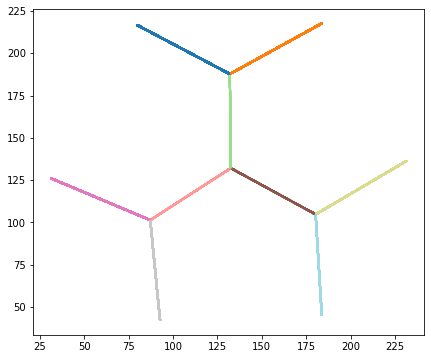

In [15]:
plt.figure(figsize=(7, 6))
plt.scatter(linear_position_df.projected_x_position, linear_position_df.projected_y_position,
            c=linear_position_df.track_segment_id, cmap='tab20', s=1)

We should also plot the linearized position itself to make sure it is okay.

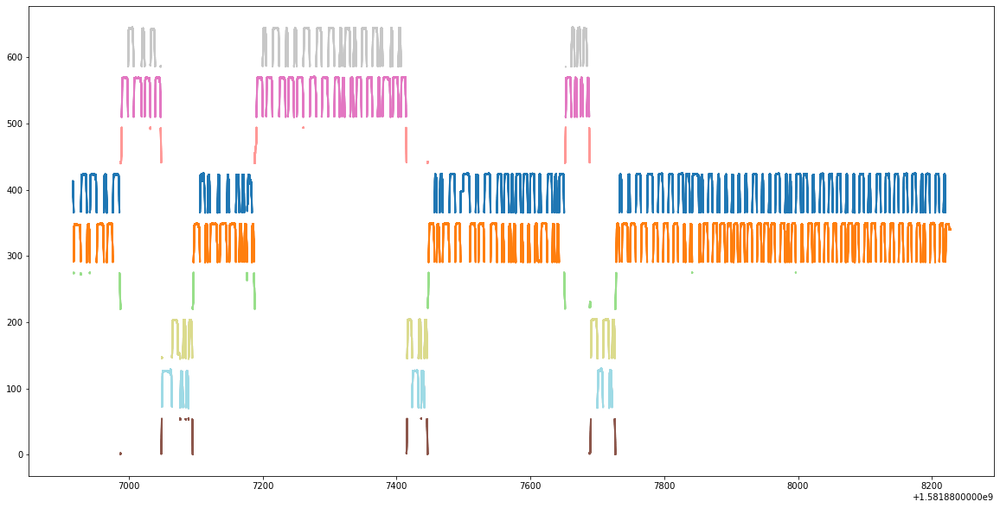

In [16]:
plt.figure(figsize=(20, 10))
plt.scatter(linear_position_df.index, linear_position_df.linear_position, s=1,
            c=linear_position_df.track_segment_id, cmap='tab20')

Okay now that we've looked at the data, we should quickly verify that all our data is the same size.

In [17]:
position_info.shape, marks.shape, linear_position_df.shape

((655645, 6), (655645, 4, 22), (655645, 4))

We also want to make sure we have valid ephys data and valid position data for decoding. Here we only have one valid time interval, but if we had more than one, we should decode on each interval separately.

In [18]:
from spyglass.common.common_interval import interval_list_intersect
from spyglass.common import IntervalList

key = {}
key['interval_list_name'] = '02_r1'
key['nwb_file_name'] = nwb_copy_file_name

interval = (IntervalList &
            {'nwb_file_name': key['nwb_file_name'],
             'interval_list_name': key['interval_list_name']}
           ).fetch1('valid_times')

valid_ephys_times = (IntervalList &
                     {'nwb_file_name': key['nwb_file_name'],
                      'interval_list_name': 'raw data valid times'}
                    ).fetch1('valid_times')
position_interval_names = (IntervalPositionInfo &
                           {'nwb_file_name': key['nwb_file_name'],
                            'position_info_param_name': 'default_decoding',
                           }
                          ).fetch('interval_list_name')
valid_pos_times = [(IntervalList &
                   {'nwb_file_name': key['nwb_file_name'],
                    'interval_list_name': pos_interval_name}
                  ).fetch1('valid_times')
                  for pos_interval_name in position_interval_names]

intersect_interval = interval_list_intersect(
    interval_list_intersect(interval, valid_ephys_times), valid_pos_times[0])
valid_time_slice = slice(intersect_interval[0][0], intersect_interval[0][1])
valid_time_slice

slice(1581886916.3153033, 1581888227.5987928, None)

In [19]:
linear_position_df = linear_position_df.loc[valid_time_slice]
marks = marks.sel(time=valid_time_slice)
position_info = position_info.loc[valid_time_slice]

In [20]:
position_info.shape, marks.shape, linear_position_df.shape

((655643, 6), (655643, 4, 22), (655643, 4))

## Decoding

Okay, now having sanity checked the data, we can finally get to decoding. In the future this will be a pipeline, but for now it is manual as the table structure is still being prototyped. 

In order to set the parameters, we can fetch the default parameters and modify them.

For 1D decoding, it is best to pass in the track graph and track graph parameters we used for linearization in order for the random walk to be handled properly. We can also set the amount of smoothing in the position and mark dimensions: `position_std` and `mark_std` respectively. Finally we set the `block_size`, which controls how many samples get processed at a time so that we don't run out of GPU memory.

In [21]:
from replay_trajectory_classification.environments import Environment
from spyglass.common.common_position import TrackGraph
from spyglass.decoding.clusterless import ClusterlessClassifierParameters

import pprint


parameters = (ClusterlessClassifierParameters() & {'classifier_param_name': 'default_decoding_gpu'}).fetch1()

track_graph = (TrackGraph() & {'track_graph_name': '6 arm'}).get_networkx_track_graph()
track_graph_params = (TrackGraph() & {'track_graph_name': '6 arm'}).fetch1()

parameters['classifier_params']['environments'] = [
    Environment(
    track_graph=track_graph,
    edge_order=track_graph_params['linear_edge_order'],
    edge_spacing=track_graph_params['linear_edge_spacing'])]

parameters['classifier_params']['clusterless_algorithm'] = 'multiunit_likelihood_integer_gpu'
parameters['classifier_params']['clusterless_algorithm_params'] = {
    'mark_std': 24.0,
    'position_std': 6.0,
    'block_size': 100,
 }

pprint.pprint(parameters)

{'classifier_param_name': 'default_decoding_gpu',
 'classifier_params': {'clusterless_algorithm': 'multiunit_likelihood_integer_gpu',
                       'clusterless_algorithm_params': {'block_size': 100,
                                                        'mark_std': 24.0,
                                                        'position_std': 6.0},
                       'continuous_transition_types': [[RandomWalk(environment_name='', movement_var=6.0, movement_mean=0.0),
                                                        Uniform(environment_name='', environment2_name=None)],
                                                       [Uniform(environment_name='', environment2_name=None),
                                                        Uniform(environment_name='', environment2_name=None)]],
                       'discrete_transition_type': DiagonalDiscrete(diagonal_value=0.98),
                       'environments': [Environment(environment_name='', place_bin_size=2.

In [22]:
parameters['classifier_params']

{'environments': [Environment(environment_name='', place_bin_size=2.0, track_graph=<networkx.classes.graph.Graph object at 0x7f338bcb3790>, edge_order=[(3, 6), (6, 8), (6, 9), (3, 1), (1, 2), (1, 0), (3, 4), (4, 5), (4, 7)], edge_spacing=15, is_track_interior=None, position_range=None, infer_track_interior=True)],
 'observation_models': None,
 'continuous_transition_types': [[RandomWalk(environment_name='', movement_var=6.0, movement_mean=0.0),
   Uniform(environment_name='', environment2_name=None)],
  [Uniform(environment_name='', environment2_name=None),
   Uniform(environment_name='', environment2_name=None)]],
 'discrete_transition_type': DiagonalDiscrete(diagonal_value=0.98),
 'initial_conditions_type': UniformInitialConditions(),
 'infer_track_interior': True,
 'clusterless_algorithm': 'multiunit_likelihood_integer_gpu',
 'clusterless_algorithm_params': {'mark_std': 24.0,
  'position_std': 6.0,
  'block_size': 100}}

After we set the parameters, we can run the decoding.

In [23]:
from replay_trajectory_classification import ClusterlessClassifier


classifier = ClusterlessClassifier(**parameters['classifier_params'])
classifier.fit(
    position=linear_position_df.linear_position.values,
    multiunits=marks.values,
    **parameters['fit_params']
)
results = classifier.predict(
    multiunits=marks.values,
    time=linear_position_df.index,
    **parameters['predict_params']
)
logging.info('Done!')

/home/edeno/miniconda3/envs/spyglass/lib/python3.8/site-packages/replay_trajectory_classification/bins.py:167: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  track_segment_id[is_nan] = 0  # need to check
/home/edeno/miniconda3/envs/spyglass/lib/python3.8/site-packages/replay_trajectory_classification/bins.py:352: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  is_track_interior = np.ones_like(place_bin_centers, dtype=np.bool)
29-Mar-22 16:11:58 Fitting initial conditions...
29-Mar-22 16

Finally, we can plot the decodes to make sure they make sense.

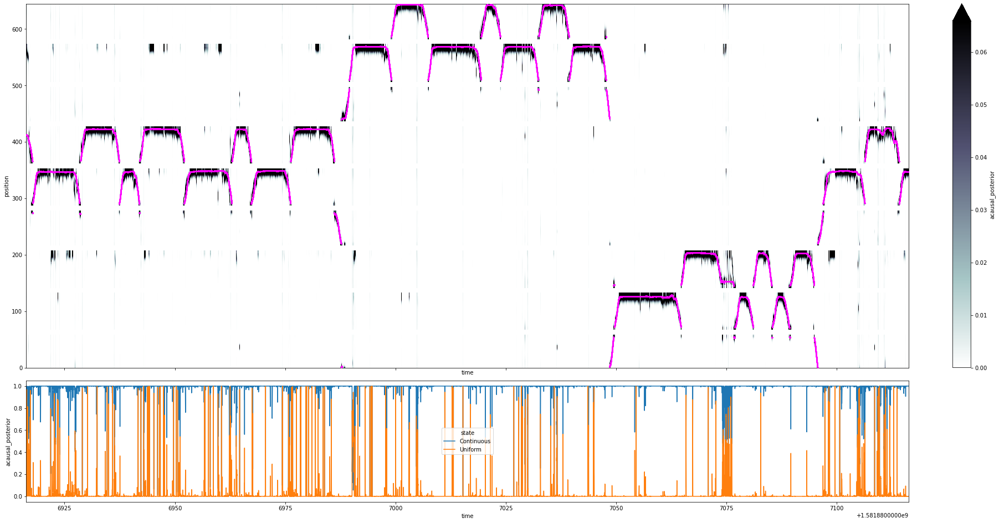

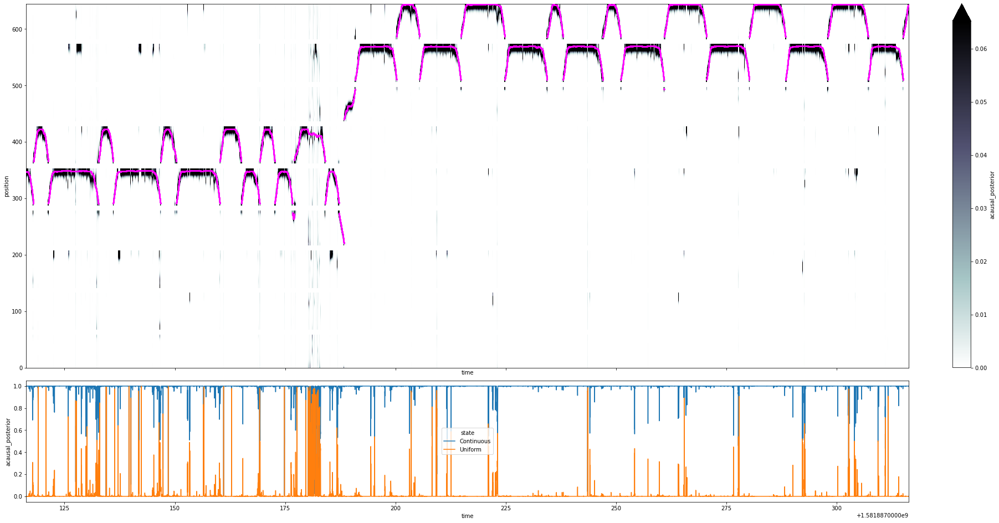

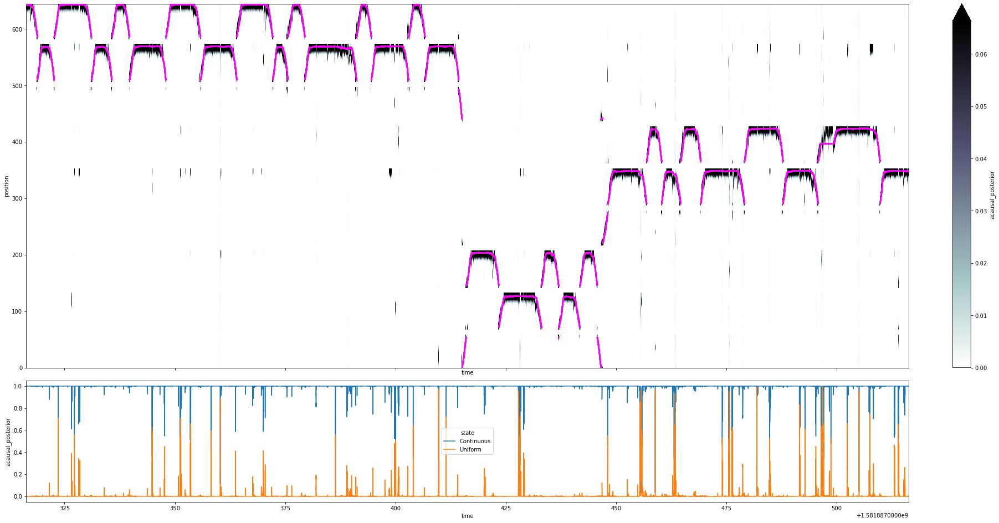

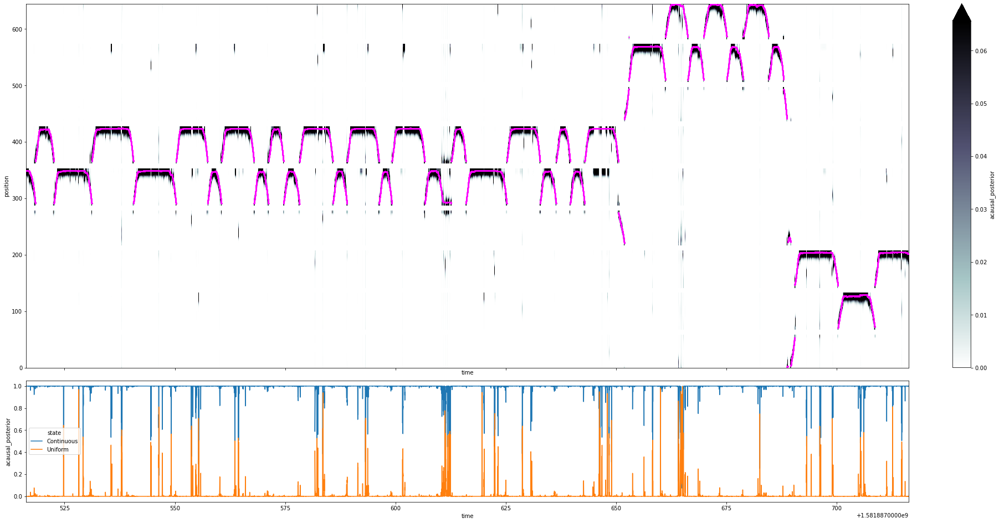

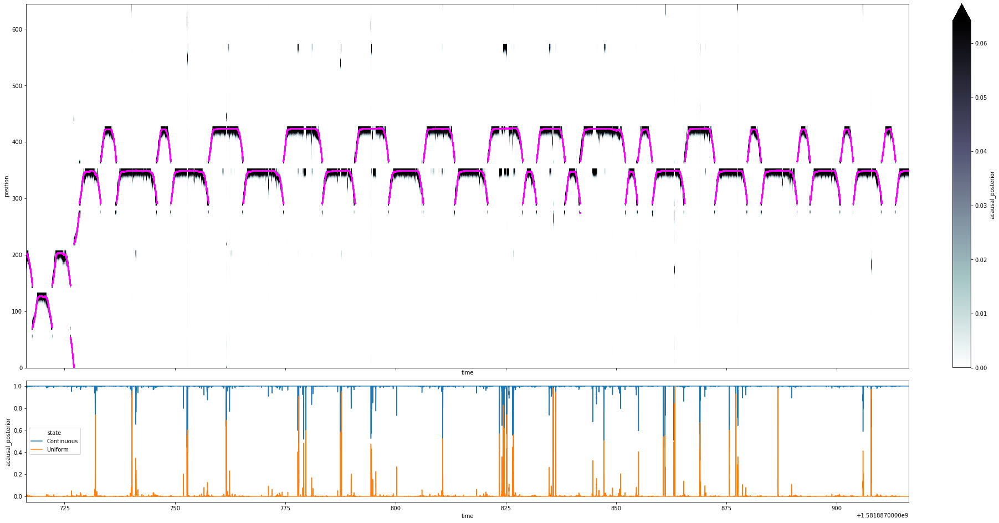

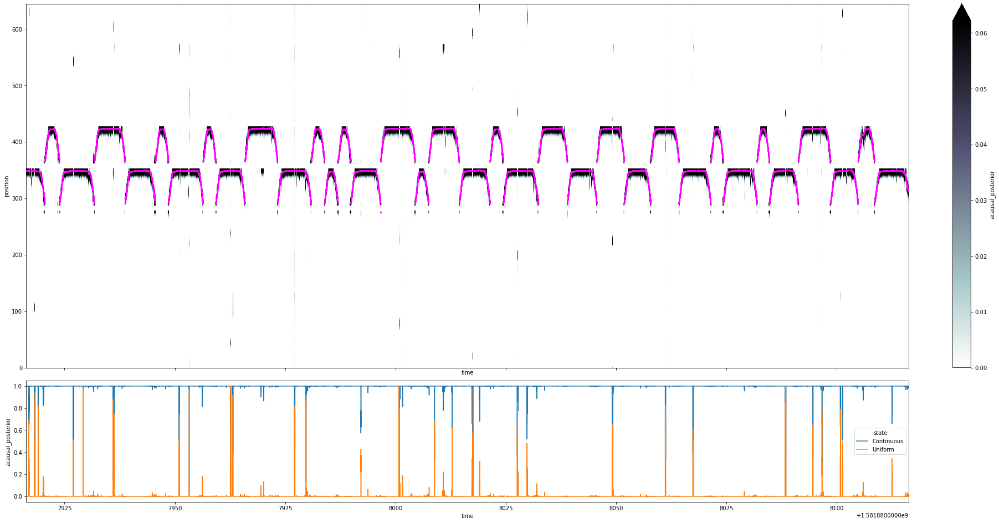

In [24]:
import matplotlib.pyplot as plt
for time_ind in range(0, 600_000, 100_000):
    time_slice = slice(time_ind, time_ind + 100_000)

    fig, axes = plt.subplots(2, 1, figsize=(25, 13), sharex=True, constrained_layout=True, gridspec_kw={"height_ratios": [3, 1]},)
    results.isel(time=time_slice).acausal_posterior.sum('state').plot(x='time', y='position', ax=axes[0], robust=True, cmap='bone_r')
    axes[0].scatter(linear_position_df.iloc[time_slice].index,
                    linear_position_df.iloc[time_slice].linear_position.values,
                    s=1, color='magenta', zorder=10)

    results.isel(time=time_slice).acausal_posterior.sum('position').plot(x='time', hue='state', ax=axes[1])

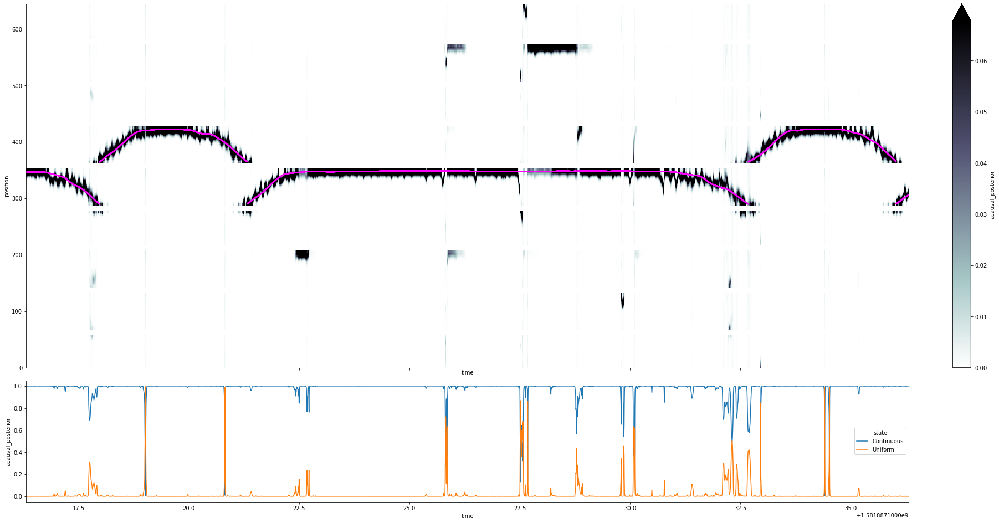

In [25]:
import matplotlib.pyplot as plt

time_slice = slice(100_000, 110_000)

fig, axes = plt.subplots(2, 1, figsize=(25, 13), sharex=True, constrained_layout=True, gridspec_kw={"height_ratios": [3, 1]},)

results.isel(time=time_slice).acausal_posterior.sum('state').plot(x='time', y='position', ax=axes[0], robust=True, cmap='bone_r')
axes[0].scatter(linear_position_df.iloc[time_slice].index,
                linear_position_df.iloc[time_slice].linear_position.values,
                s=1, color='magenta', zorder=10)

results.isel(time=time_slice).acausal_posterior.sum('position').plot(x='time', hue='state', ax=axes[1])

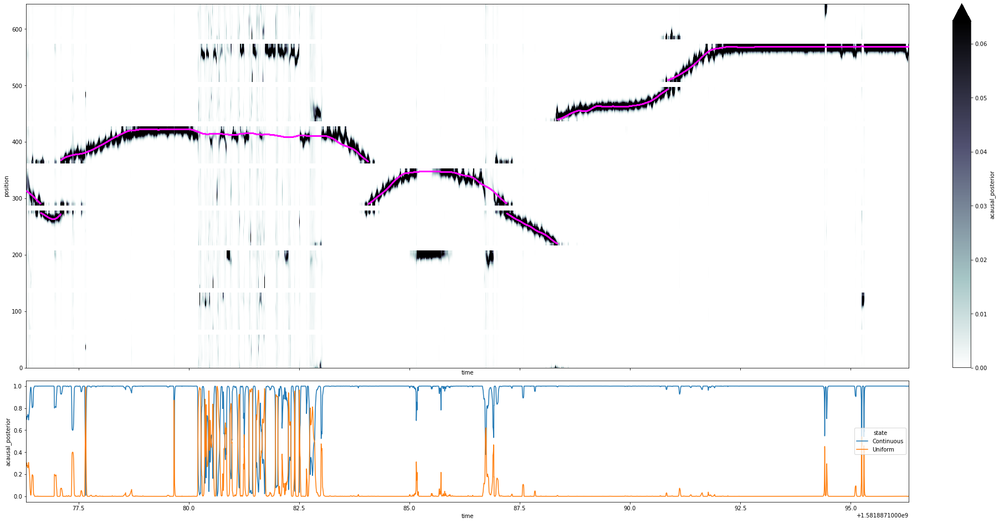

In [26]:
import matplotlib.pyplot as plt

time_slice = slice(130_000, 140_000)

fig, axes = plt.subplots(2, 1, figsize=(25, 13), sharex=True, constrained_layout=True, gridspec_kw={"height_ratios": [3, 1]},)

results.isel(time=time_slice).acausal_posterior.sum('state').plot(x='time', y='position', ax=axes[0], robust=True, cmap='bone_r')
axes[0].scatter(linear_position_df.iloc[time_slice].index,
                linear_position_df.iloc[time_slice].linear_position.values,
                s=1, color='magenta', zorder=10)

results.isel(time=time_slice).acausal_posterior.sum('position').plot(x='time', hue='state', ax=axes[1])

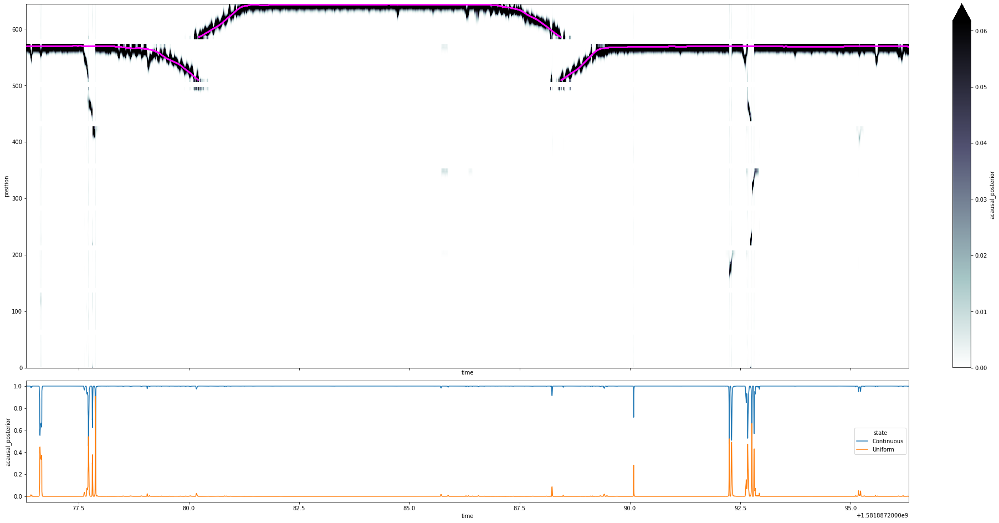

In [27]:
import matplotlib.pyplot as plt

time_slice = slice(180_000, 190_000)

fig, axes = plt.subplots(2, 1, figsize=(25, 13), sharex=True, constrained_layout=True, gridspec_kw={"height_ratios": [3, 1]},)

results.isel(time=time_slice).acausal_posterior.sum('state').plot(x='time', y='position', ax=axes[0], robust=True, cmap='bone_r')
axes[0].scatter(linear_position_df.iloc[time_slice].index,
                linear_position_df.iloc[time_slice].linear_position.values,
                s=1, color='magenta', zorder=10)

results.isel(time=time_slice).acausal_posterior.sum('position').plot(x='time', hue='state', ax=axes[1])

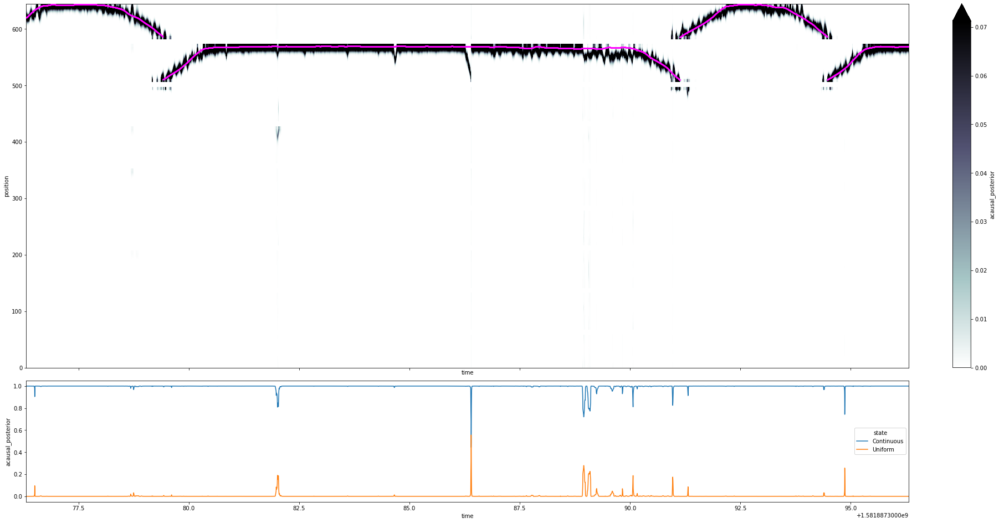

In [28]:
import matplotlib.pyplot as plt

time_slice = slice(230_000, 240_000)

fig, axes = plt.subplots(2, 1, figsize=(25, 13), sharex=True, constrained_layout=True, gridspec_kw={"height_ratios": [3, 1]},)

results.isel(time=time_slice).acausal_posterior.sum('state').plot(x='time', y='position', ax=axes[0], robust=True, cmap='bone_r')
axes[0].scatter(linear_position_df.iloc[time_slice].index,
                linear_position_df.iloc[time_slice].linear_position.values,
                s=1, color='magenta', zorder=10)

results.isel(time=time_slice).acausal_posterior.sum('position').plot(x='time', hue='state', ax=axes[1])

In [29]:
from trajectory_analysis_tools import get_trajectory_data, get_ahead_behind_distance

trajectory_data = get_trajectory_data(
    results.sum('state').acausal_posterior,
    track_graph,
    classifier,
    linear_position_df[['projected_x_position', 'projected_y_position']],
    linear_position_df.track_segment_id,
    position_info.head_orientation,
)

ahead_behind_distance = get_ahead_behind_distance(
    track_graph, *trajectory_data)
mental_position_edges = trajectory_data[-1]
mental_position_edge_id = np.asarray(
    [track_graph.edges[edge]['edge_id'] for edge in mental_position_edges])

In [30]:
from ripple_detection import get_multiunit_population_firing_rate

SAMPLING_FREQUENCY = 500

multiunit_spikes = (np.any(~np.isnan(marks.values), axis=1)
                    ).astype(float)
multiunit_firing_rate = pd.DataFrame(
    get_multiunit_population_firing_rate(
        multiunit_spikes, SAMPLING_FREQUENCY), index=marks.time,
    columns=['firing_rate'])

In [31]:
from ripple_detection import multiunit_HSE_detector

multiunit_high_synchrony_times = multiunit_HSE_detector(
    marks.time.values,
    multiunit_spikes,
    position_info.head_speed.values,
    sampling_frequency=SAMPLING_FREQUENCY,
    minimum_duration=0.015,
    zscore_threshold=2.0,
    close_event_threshold=0.000)

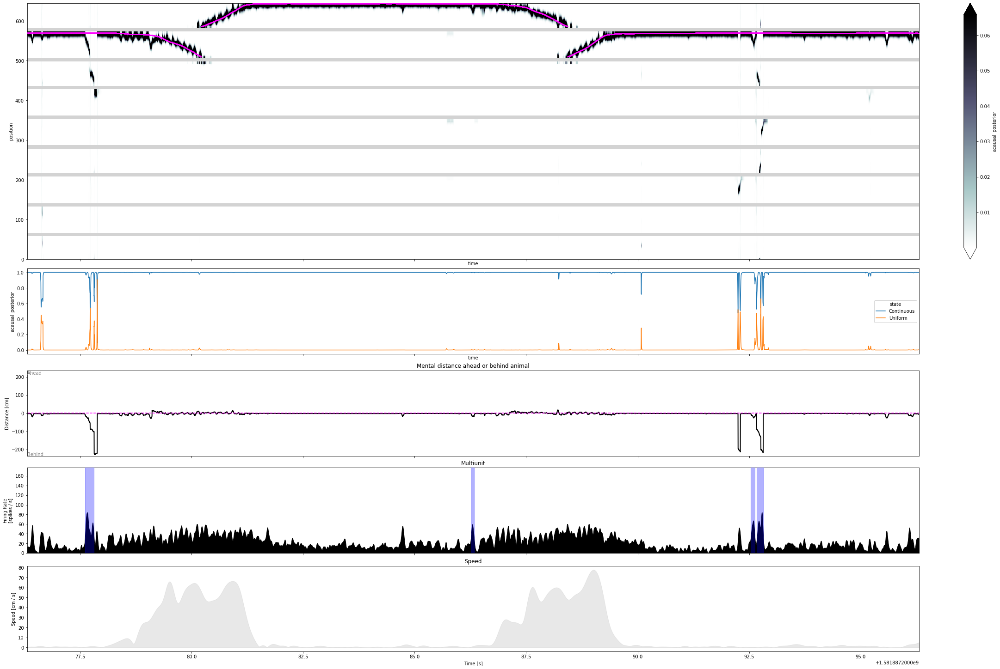

In [32]:
import matplotlib.pyplot as plt
import copy


def plot_classifier(
    time_slice,
    results,
    classifier,
    position_info,
    linear_position_df,
    ahead_behind_distance,
    multiunit_firing_rate,
    multiunit_high_synchrony_times,
    cmap='bone_r',
    figsize=(30, 20)
):

    cmap = copy.copy(plt.cm.get_cmap(cmap))
    cmap.set_bad(color="lightgrey", alpha=1.0)

    fig, axes = plt.subplots(5, 1, figsize=figsize, sharex=True, constrained_layout=True,
                             gridspec_kw={"height_ratios": [3, 1, 1, 1, 1]},)

    time = results.isel(time=time_slice).time
    (results
     .isel(time=time_slice)
     .acausal_posterior
     .sum('state')
     .where(classifier.environments[0].is_track_interior_)
     .plot(x='time', y='position', ax=axes[0], robust=True, cmap=cmap))
    axes[0].scatter(time,
                    linear_position_df.iloc[time_slice].linear_position.values,
                    s=1, color='magenta', zorder=10)

    results.isel(time=time_slice).acausal_posterior.sum('position').plot(x='time', hue='state', ax=axes[1])
    axes[2].plot(time,
                 ahead_behind_distance[time_slice],
                 color="black", linewidth=2)
    axes[2].axhline(0, color="magenta", linestyle="--")
    axes[2].set_title("Mental distance ahead or behind animal")
    axes[2].set_ylabel("Distance [cm]")
    max_dist = np.max(np.abs(ahead_behind_distance)) + 5
    axes[2].set_ylim((-max_dist, max_dist))
    axes[2].text(time[0], max_dist - 1, "Ahead", color="grey", va='top')
    axes[2].text(time[0], -max_dist + 1, "Behind", color="grey")

    # ax 3
    axes[3].fill_between(
        multiunit_firing_rate.iloc[time_slice].index.values,
        multiunit_firing_rate.iloc[time_slice].values.squeeze(),
        color="black",
    )
    axes[3].set_ylabel("Firing Rate\n[spikes / s]")
    axes[3].set_title("Multiunit")
    axes[3].set_ylim((0.0, np.max(np.asarray(multiunit_firing_rate))))


    cur_multiunit_HSE = interval_list_intersect(
        np.asarray(multiunit_high_synchrony_times),
        np.asarray([(time[0], time[-1])]))

    for start_time, end_time in cur_multiunit_HSE:
        axes[3].axvspan(start_time, end_time, color='blue', alpha=0.3, zorder=10)

    # ax 4
    axes[4].fill_between(
        time,
        position_info.iloc[time_slice]
        .head_speed.values.squeeze(),
        color="lightgrey",
        linewidth=1,
        alpha=0.5,
    )
    axes[4].set_title('Speed')
    axes[4].set_ylabel("Speed [cm / s]")
    axes[4].set_xlabel("Time [s]")
    

time_slice = slice(180_000, 190_000)
plot_classifier(time_slice, results, classifier, position_info, linear_position_df, ahead_behind_distance,
                multiunit_firing_rate, multiunit_high_synchrony_times)

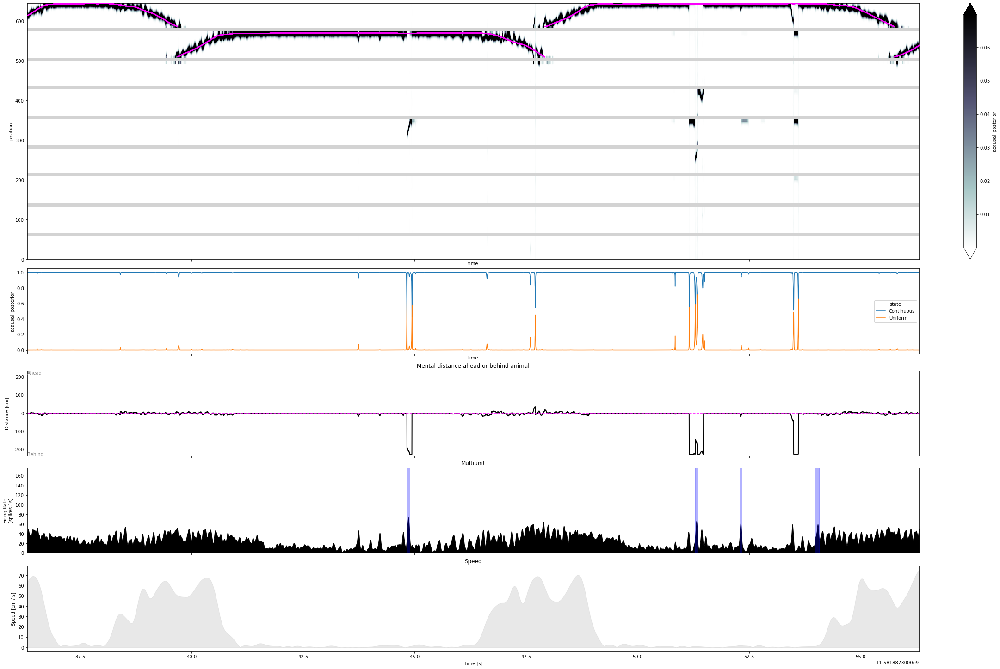

In [33]:
time_slice = slice(210_000, 220_000)
plot_classifier(time_slice, results, classifier, position_info, linear_position_df, ahead_behind_distance,
                multiunit_firing_rate, multiunit_high_synchrony_times)

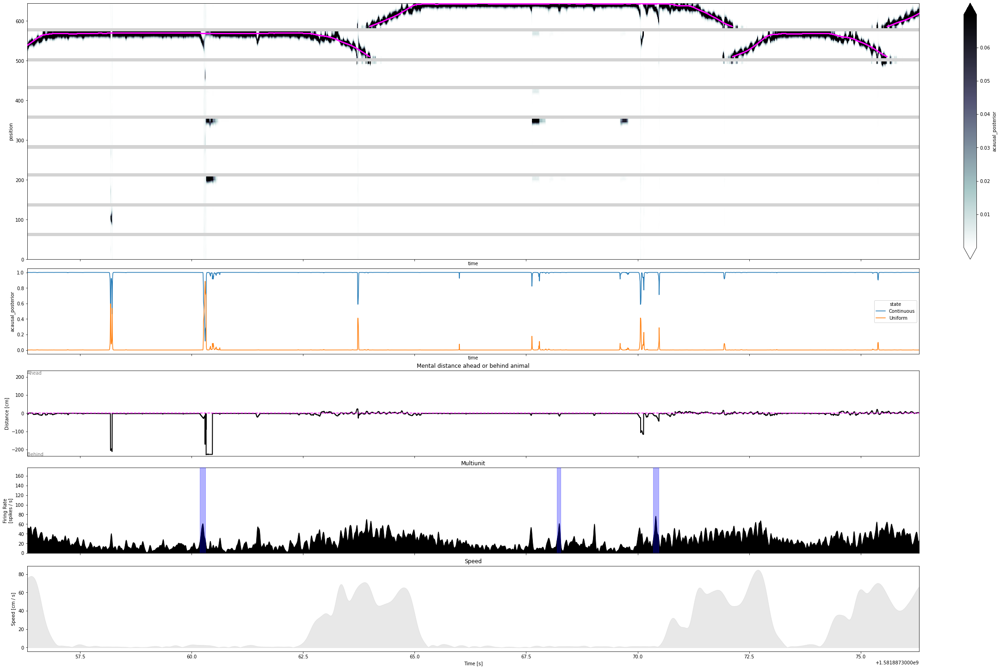

In [34]:
time_slice = slice(220_000, 230_000)
plot_classifier(time_slice, results, classifier, position_info, linear_position_df, ahead_behind_distance,
                multiunit_firing_rate, multiunit_high_synchrony_times)